# Домашнее задание #4: Базовое машинное обучение

av Марат Богаутдинов, 232  

работа основана на тетрадках с практических занятий, а какие-то идеи брались из тетрадок 

## шаг 0: скачиваем датасет

In [1]:
import pandas as pd

In [2]:
!curl -L -o mobile-price-classification.zip https://www.kaggle.com/api/v1/datasets/download/iabhishekofficial/mobile-price-classification

df = pd.read_csv('train.csv') # работаем только с этим файлом, так как во втором нет ответов

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0

100 72340  100 72340    0     0  73941      0 --:--:-- --:--:-- --:--:-- 73941


In [3]:
df.head(3)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2


In [4]:
# переименуем price_range в target
df = df.rename(columns={'price_range': 'target'})
df.head(1)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,target
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1


## шаг 1: Exploratory Data Analysis

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

**1.&emsp;Пока посмотрим просто на данные: сначала типы, а потом всякие простейшие статистические данные**

In [6]:
df.dtypes.unique()

array([dtype('int64'), dtype('float64')], dtype=object)

Отлично, значит все наши данные числовые. То есть не придется кодировать категориальные в какие-то числовые. Посмотрим на всякие другие числа:

In [7]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,target
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


Что видим:
+ все данные есть, NaNов нет (по первой строчке)
+ вроде выбросов (по максимуму/минимуму) тоже вроде нет

**2.&emsp;А теперь можем посмотреть, какие данные с чем коррелируют**  
Вообще считается, что если между некоторыми данными есть корреляция около 0.1, то это уже хорошо. Посмотрим на наш датасет:

In [8]:
# это если хотеть посмотреть реальные числа корреляции, то можно и вывести (но я не очень хочу полотно цифр)
# df.corr().round(2)

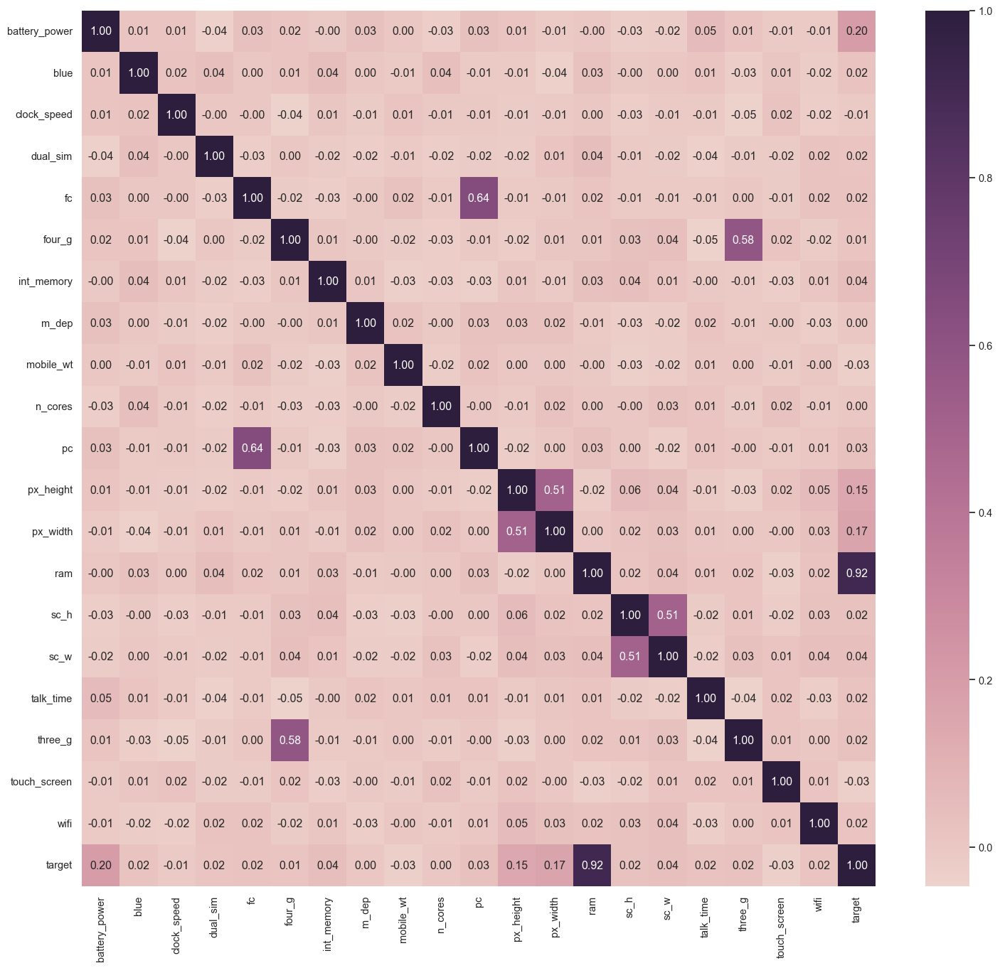

In [9]:
pearson = df.corr()

plt.figure(figsize=(18, 16))
sns.set(style="whitegrid", font_scale=0.95)
sns.heatmap(pearson, cmap=sns.cubehelix_palette(as_cmap=True), annot=True, fmt="0.2f")
plt.show()

Окей, что-то полезное даже есть: даже с корреляциями около `0.05` можно будет работать. Некоторые коэффициенты корреляций признаков с таргетной переменной очень хороши: `0.20`, `0.15`, `0.17`, `0.92`. Однако есть и коррелирующие друг с другом признаки: `px_height` с `px_width` (`0.51`), `sc_h` с `sc_w` (`0.51`), `pc` с `fc` (`0.64`), `three_g` с `four_g` (`0.58`). И это уже действительно проблема при обучении логистической регрессии: вероятно, нам понадобится бахнуть весов, чтобы линейная корреляция между этими признаками была не такой значительной.  
Но давайте еще посмотрим, что на наши данные скажут другие статистические методы определения корреляции. Дело в том, что по умолчанию `pd.DataFrame.corr()` считает корреляцию Пирсона. Интеречно посмотреть, что покажут другие расчеты:

- корреляция Кенделла

In [10]:
kendall = df.corr(method='kendall')

# plt.figure(figsize=(18, 16))
# sns.set(style="whitegrid", font_scale=0.95)
# sns.heatmap(kendall, cmap=sns.cubehelix_palette(as_cmap=True), annot=True, fmt="0.2f")
# plt.show()

- корреляция Спирмена

In [11]:
spearman = df.corr(method='spearman')

# plt.figure(figsize=(18, 16))
# sns.set(style="whitegrid", font_scale=0.95)
# sns.heatmap(df.corr(method='spearman'), cmap=sns.cubehelix_palette(as_cmap=True), annot=True, fmt="0.2f")
# plt.show()

Я решил не выводить сами тепловые карты (потому что они большие), но могу вывести две небольшие карты, которые будут показывать просто разницу между корреляцией Пирсона и двумя остальными. И оставим цифровые значения только для значимых изменений:

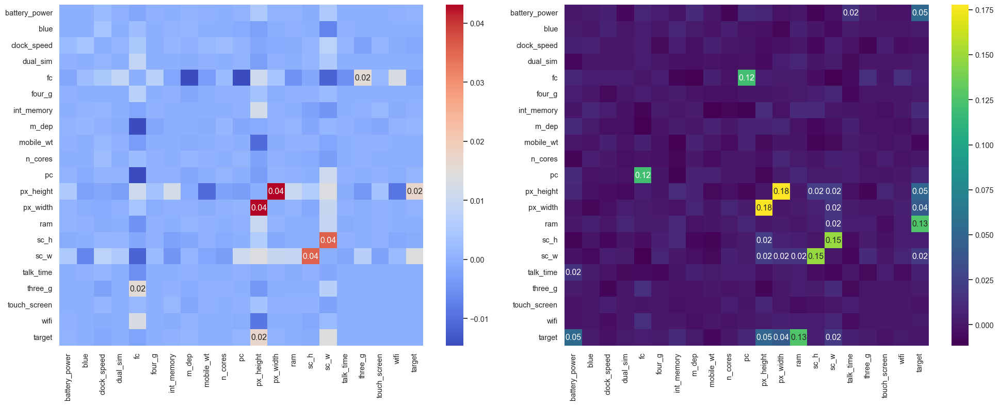

In [12]:
def number_eliminator(ax: plt.axes) -> plt.axes:
    '''
    function that removes float numbers less than 0.02 abs
    '''
    for t in ax.texts:
        if float(t.get_text()) >= 0.02 or float(t.get_text()) <= -0.02:
            t.set_text(t.get_text())
        else:
            t.set_text('')
    return ax

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# разные цвета, потому что разные деления шкал (чтобы не ввестись в заблуждение)
number_eliminator(sns.heatmap(pearson - spearman, cmap="coolwarm", annot=True, ax=axes[0], fmt="0.2f"))
number_eliminator(sns.heatmap(pearson - kendall, cmap="viridis", annot=True, ax=axes[1], fmt="0.2f"))

plt.tight_layout()
plt.show()

Судя по графику, результаты корреляций по Пирсону и Спирмену отличаются несильно, а Кендалл значения корреляций занижает. Возможно, это знание нам как-то пригодится, но я не уверен. Наверное, главное, что стоит отметить, что при подсчете всеми тремя методами корреляция сохраняется у +/- тех же пар признаков с таргетом.

**3.&emsp;Посмотрим на сбалансированность классов**

Всего у нас:

In [13]:
df['target'].value_counts()

target
1    500
2    500
3    500
0    500
Name: count, dtype: int64

4 класса по 500 объектов. **Классы сбалансированны!**

**4.&emsp;Перейдем к более детальному анализу признаков.** Хаха, наверное, можно рискнуть и сделать pairplot)) Но он будет считать уйму времени, конечно. И ничего не будет видно. Но ничего, мы потом посмотрим только на некоторые интересующие нас графики. Возможно, будет иметь смысл построить pairplot, но не по всем параметрам, а только по некоторым $-$ тем, которые коррелируют с таргетом.

In [14]:
# здесь pairplot по всем признакам - график не информативный и мелкий, так что решил не выводить

# sns.pairplot(df, hue='target')
# plt.show()

И еще один pairplot, но на этот раз всего с несколькими параметрами:

<Figure size 6400x4800 with 0 Axes>

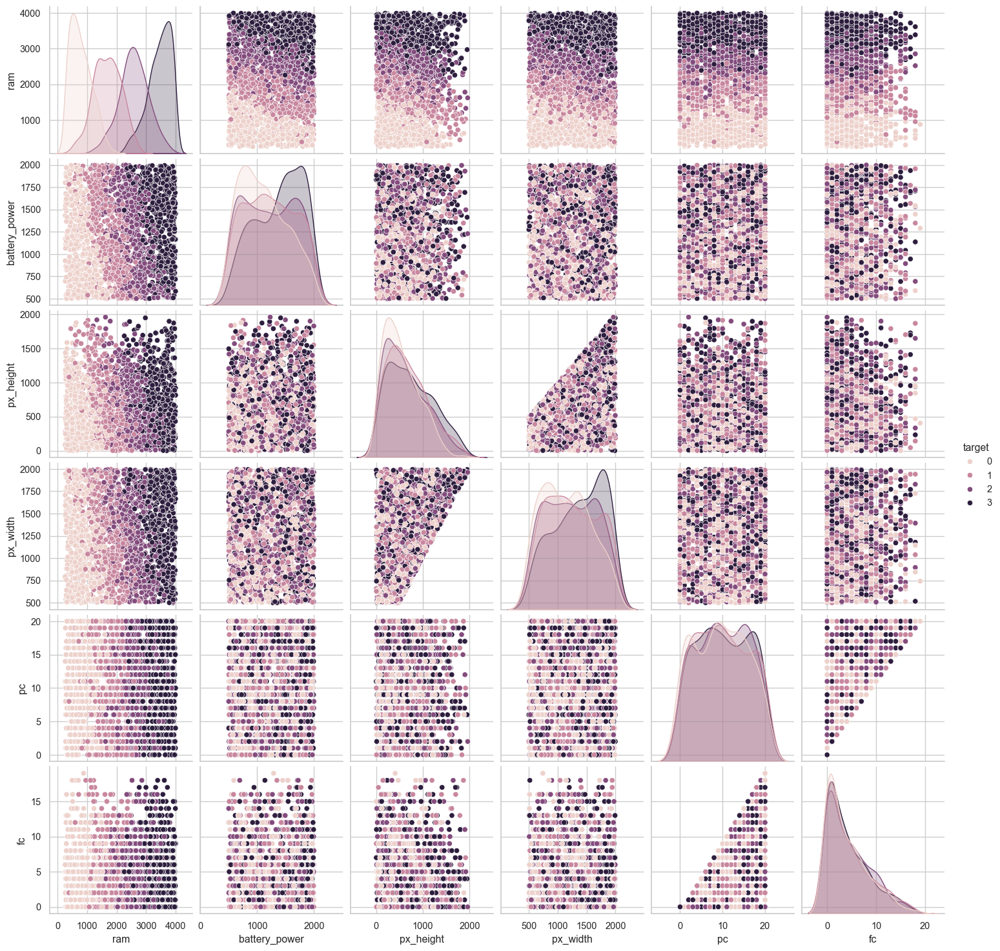

In [15]:
plt.figure(dpi=1000)
sns.pairplot(df[['ram', 'battery_power', 'px_height', 'px_width', 'target', 'pc', 'fc']], hue='target')
plt.show()

Какие два промежуточных вывода можно сделать: 
- если взять какой-то сильно коррелирующий с таргетным признак, то классы будут как ни странно отлично разграничиваться (это видно на примере `ram`);
- скорее всего, потом придется поработать над feature engineering и сделать так, чтобы логистической регрессии не мешали обучаться коррелирующие между собой признаки.

А теперь глянем на целевую переменную $-$ `target` $-$ и проведем несколько однофакторных анализов. 
Судя по тепловой карте коэффициентов корреляций и pairplot хорошо бы провести однофакторный анализ признаков `ram` и `battery_power`.

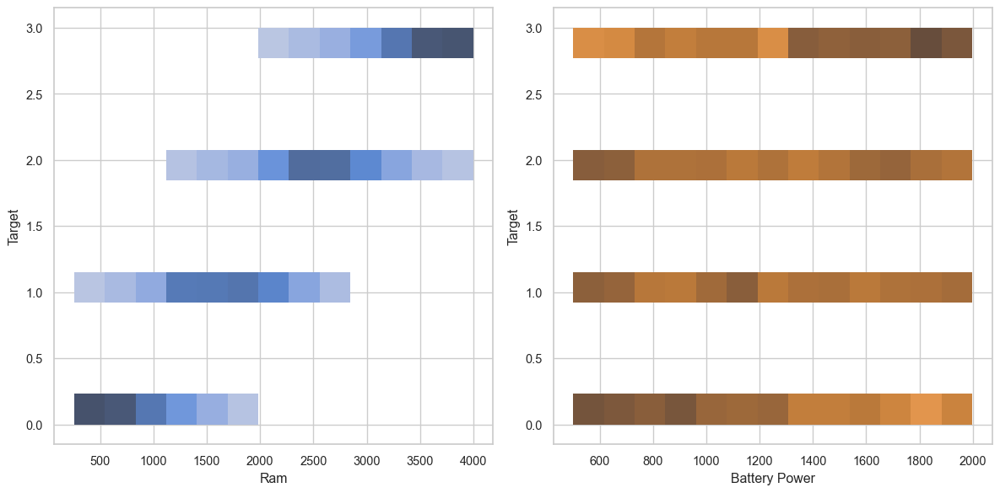

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(data=df, x="ram", y="target", ax=axes[0])
sns.histplot(data=df, x="battery_power", y="target", ax=axes[1], color='peru')

axes[0].set_xlabel('Ram')
axes[0].set_ylabel('Target')
axes[1].set_xlabel('Battery Power')
axes[1].set_ylabel('Target')

plt.tight_layout()
plt.show()

По сути, мы получили еще одну визуализацию корреляций `target` с двумя признаками (`ram` и `battery_power`). На этом графике хорошо видно, как именно связаны между собой эти признаки: отлично контрастируют модели телефонов групп 0 и 3 (на обоих графиках), группы моделей 1 и 2 ожидаемо хуже.  

А вот еще одна визуализация, на которой еще видно количество моделей с разными показателями по `ram` и `battery_power`. 

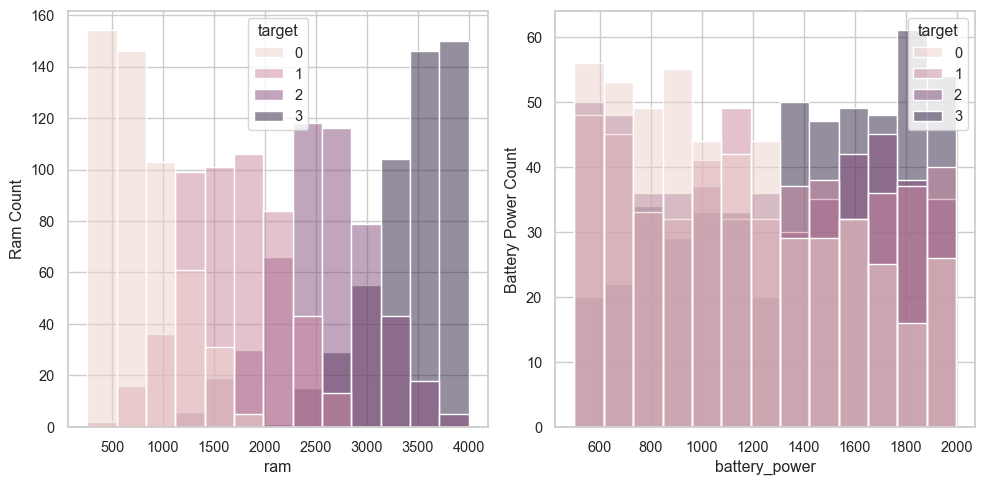

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

sns.histplot(df, x="ram", hue="target", ax=axes[0])
sns.histplot(df, x="battery_power", hue="target", ax=axes[1])

axes[0].set_ylabel('Ram Count')
axes[1].set_ylabel('Battery Power Count')

plt.tight_layout()
plt.show()

Если бы не было признака `ram`, то классифицирующая сила модели была бы значительно слабее. Хотя, возможно, ей и удавалось бы выделять более-менее удачно 3-ю группу. Давайте теперь посмотрим на то, как ведут себя некоторые статистические данные по `ram` и `battery_power` в зависимости от ценовой группы:

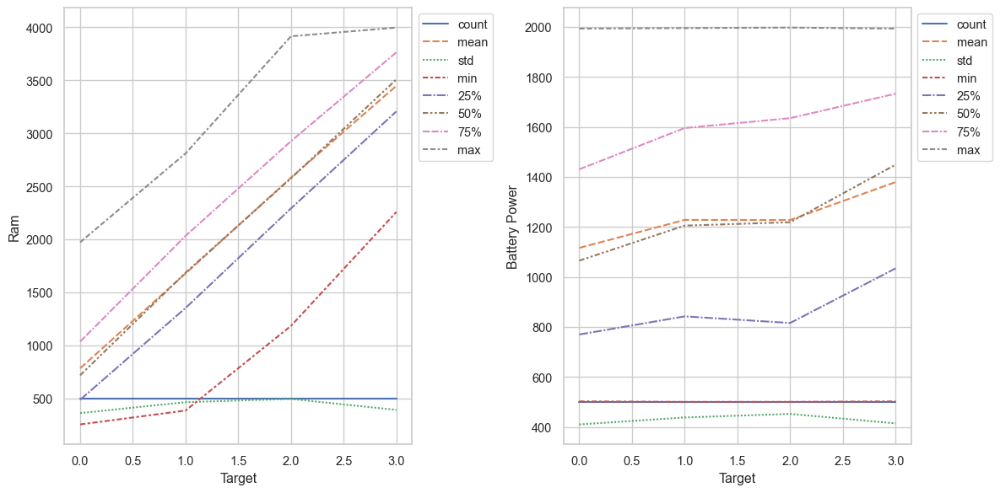

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.lineplot(data=df.groupby('target')['ram'].describe(), ax=axes[0]).legend(loc="upper left", bbox_to_anchor=(1, 1))
sns.lineplot(data=df.groupby('target')['battery_power'].describe(), ax=axes[1]).legend(loc="upper left", bbox_to_anchor=(1, 1))

axes[0].set_ylabel('Ram')
axes[0].set_xlabel('Target')
axes[1].set_ylabel('Battery Power')
axes[1].set_xlabel('Target')

plt.tight_layout()
plt.show()

В общем, подтвердилось то, что мы примерно предполагали относительно 1-й и 2-й групп: по признаку `battery_power`они почти не отличаются $-$ возможно, это повлияет на правильность разграничения этих двух групп при обучении модели.

Что еще можно посмотреть? Например, стоит проверить есть ли такие признаки, которые небинарно (не `{0, 1}`) перекодировали из категориальных. Дело в том, что кодирование категориальных признаков обычной последовательностью чисел может дать неверные результаты: модель их будет воспринимать как числа.

In [19]:
df.apply(lambda x: np.sort(x.unique()))

battery_power    [501, 502, 503, 504, 506, 507, 508, 509, 510, ...
blue                                                        [0, 1]
clock_speed      [0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, ...
dual_sim                                                    [0, 1]
fc               [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
four_g                                                      [0, 1]
int_memory       [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...
m_dep            [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, ...
mobile_wt        [80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 9...
n_cores                                   [1, 2, 3, 4, 5, 6, 7, 8]
pc               [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
px_height        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14,...
px_width         [500, 501, 503, 506, 507, 508, 509, 510, 511, ...
ram              [256, 258, 259, 262, 263, 265, 267, 273, 277, ...
sc_h             [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 1

Кажется, все в порядке: есть только небинарные некатегориальные признаки и бинарные категориальные. Можно только добавить, что признак `n_cores`, должно быть, отражает числа, имеющие отношение к реальности, а именно фактическое число ядер в процессоре. Вызывают вопросы признаки `pc`, `fc`, потому что значения начинаются с 0 и продолжаются не понятно до куда. Давайте посмотрим внимательнее, кто это такой вообще зверь:

In [20]:
print(f'pc: {np.sort(df['pc'].unique())},\nfc: {np.sort(df['fc'].unique())}')

pc: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20],
fc: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


Окей, будем считать, что все в порядке и это не бывший категориальный признак :))  
Возможно, мы их потом вообще выкинем из признаковой матрицы, потому что они сильно коррелируют между собой, почти никак не коррелируя с целевой переменной.

**5.&emsp;Выводы по EDA**  
Итак, какие выводы можно сделать?  
&emsp;- классы сбалансированы $-$ всего 4 таргетных класса по 500 объектов;  
&emsp;- есть не меньше 4 неплохо коррелирующих с таргетным признака;  
&emsp;- тем не менее некоторые признаки коррелируют между собой $-$ это проблема, которую придется решать при обучении модели методом логистической  
&emsp;регрессии;  
&emsp;- признаки `ram` и `battery_power` относительно неплохо разграничивают классы объектов;  
&emsp;- нет категориальных признаков или неправильно закодированных (не `one-hot-one` кодированием).  

Ну все, разведочный анализ проведен. Теперь разобьем данные на выборки и приступим к обучению моделей.

Кстати, как оказалось, есть удобный инструмент, который делает почти EDA (только без словесных объяснений). Мда :/ Но вообще круто!!

In [21]:
# pip install ydata_profiling

In [22]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## шаг 2: классификация методом kNN

**1.&emsp;Обучим 4 модели с дефолтными параметрами**

In [23]:
from mlxtend.plotting import plot_decision_regions
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

target_labels = np.sort(df.target.unique())

### модель 1: из признаков оставим только `ram`, `battery power`

In [24]:
# делим на параметры и целевые значения

X = df[['ram', 'battery_power']]
y_true = df['target']

# берем дефолтный kNN классификатор

model_1 = KNeighborsClassifier()
model_1.fit(X, y_true)

KNeighborsClassifier()

<Axes: >

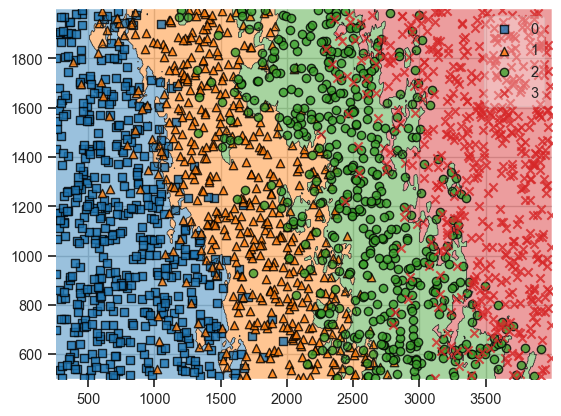

In [25]:
# визуализируем разбивку
plot_decision_regions(X.values, y_true.values.flatten().astype(np.integer), model_1)

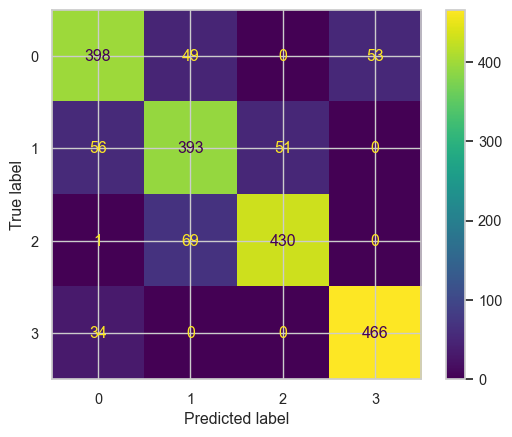

In [26]:
# оцениваем модель

y_hat = model_1.predict(X)
labels = df['target'].unique()

matrix = confusion_matrix(y_true, y_hat, labels=labels, normalize=None)

disp = ConfusionMatrixDisplay(confusion_matrix=matrix,
                              display_labels=target_labels)
disp.plot();

### модель 2: из признаков оставим только `px_height`, `ram`

In [27]:
# делим на параметры и целевые значения

X = df[['px_height', 'ram']]
y_true = df['target']

# дефолтный kNN классификатор

model_2 = KNeighborsClassifier()
model_2.fit(X, y_true)

KNeighborsClassifier()

<Axes: >

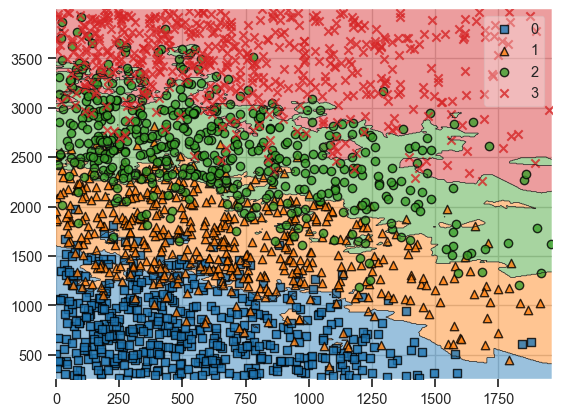

In [28]:
# визуализируем разбивку
plot_decision_regions(X.values, y_true.values.flatten().astype(np.integer), model_2)

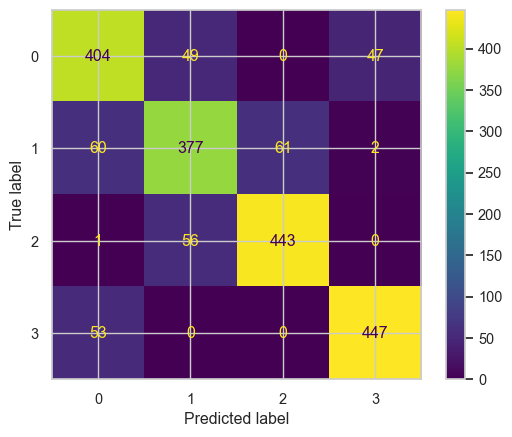

In [29]:
# оцениваем модель

y_hat = model_2.predict(X)
labels = df['target'].unique()

matrix = confusion_matrix(y_true, y_hat, labels=labels, normalize=None)

disp = ConfusionMatrixDisplay(confusion_matrix=matrix,
                              display_labels=target_labels)
disp.plot();

### модель 3: из признаков оставим только `ram`, `battery power`, `px_height`, `px_width`

In [30]:
# делим на параметры и целевые значения

X = df[['px_height', 'ram', 'px_height', 'px_width']]
y_true = df['target']

# берем дефолтный kNN классификатор

model_3 = KNeighborsClassifier() 
model_3.fit(X, y_true)

KNeighborsClassifier()

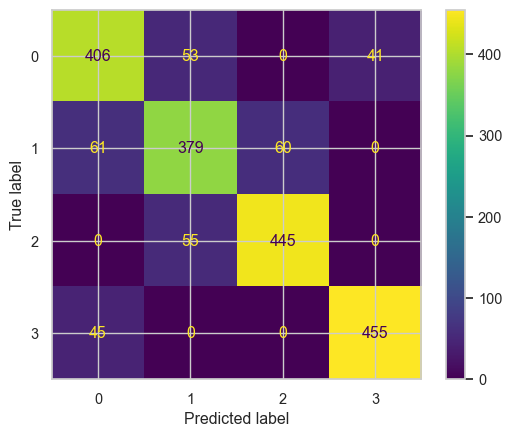

In [31]:
# оцениваем модель

y_hat = model_3.predict(X)

matrix = confusion_matrix(y_true, y_hat, labels=labels, normalize=None)

disp = ConfusionMatrixDisplay(confusion_matrix=matrix,
                              display_labels=target_labels)
disp.plot();

### модель 4: все признаки

In [32]:
# делим на параметры и целевые значения

X = df.drop(['target'], axis=1)

# дефолтный kNN классификатор

model_4 = KNeighborsClassifier()
model_4.fit(X, y_true)

KNeighborsClassifier()

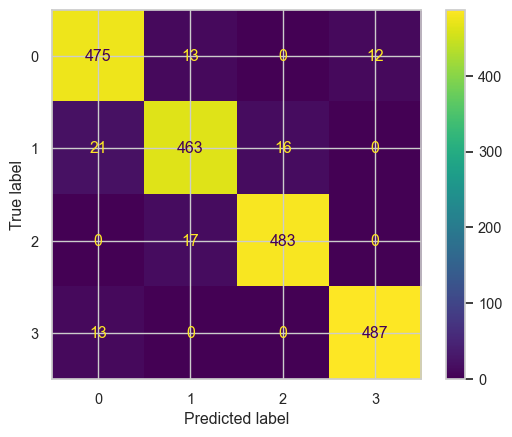

In [33]:
# оцениваем модель

y_hat = model_4.predict(X)

matrix = confusion_matrix(y_true, y_hat, labels=labels, normalize=None)

disp = ConfusionMatrixDisplay(confusion_matrix=matrix,
                              display_labels=target_labels)
disp.plot();

**2.&emsp;Выводы**  

Отлично видно, что чем больше признаков используется при обучении модели, тем выше ее качество (по крайней мере, это верно для наших данных). В целом так и должно быть, однако все равно есть ошибки при определении соседних классов. Возможно, подобрав веса и другие гиперпараметры, модель будет работать еще лучше.

## шаг 3: поделим на выборки и улучшим модель

**0.&emsp;Модель со всеми признаками, обучаем на выборках**  

Это нам понадобится для честного сравнения моделей: до и после `GridSearch`

In [34]:
X = df.drop(['target'], axis=1)
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102)

model_5 = KNeighborsClassifier()
model_5.fit(X_train, y_train)

pred = model_5.predict(X_test)

print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       1.00      0.93      0.97        92
           1       0.91      0.90      0.91       101
           2       0.85      0.89      0.87        96
           3       0.93      0.95      0.94       111

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



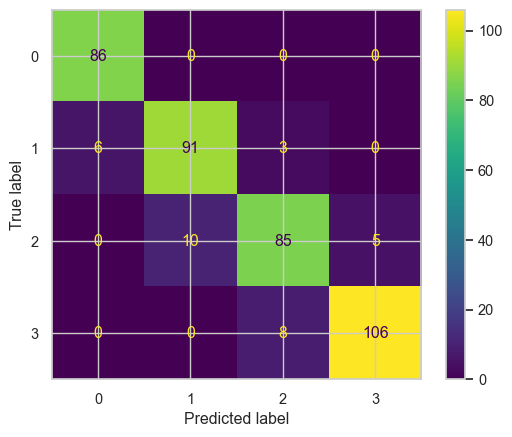

In [35]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

Окей, `accuracy` составил 0.92, зафиксировали

**1.&emsp;Метод `GridSearch` для подбора гиперпараметров**

Теперь можем подобрать гиперпараметры через grid search (тут мой основной референс на [документацию](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) и [рандомный сайт](https://towardsdatascience.com/gridsearchcv-for-beginners-db48a90114ee/))

In [36]:
def superBestPredictor(df):
    '''
    This function just makes samples, finds parameters and trains a knn-model
    '''
    
    X = df.drop(['target'], axis=1)
    y = df['target']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102)
    
    parameters = {
        'n_neighbors': np.arange(3, 70, 2).tolist(),   # Different values for k
        'weights': ['uniform', 'distance'],  # Weighting strategy
        'metric': ['euclidean', 'manhattan', 'minkowski']  # Distance metric
    }
    
    knn = KNeighborsClassifier()
    
    grid_search = GridSearchCV(knn, parameters, cv=5, scoring="accuracy", n_jobs=-1)
    clf = GridSearchCV(knn, parameters, cv=5, verbose=1)
    print(clf.fit(X_train, y_train))
    
    cv_res = pd.DataFrame(clf.cv_results_)[['params', 'mean_fit_time', 'mean_test_score', 'rank_test_score']]
    
    knn = clf.best_estimator_
    pred = knn.predict(X_test)
    
    return pred, cv_res


pred, cv_res = superBestPredictor(df)
print(classification_report(pred, y_test))

Fitting 5 folds for each of 204 candidates, totalling 1020 fits
GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23,
                                         25, 27, 29, 31, 33, 35, 37, 39, 41, 43,
                                         45, 47, 49, 51, 53, 55, 57, 59, 61, ...],
                         'weights': ['uniform', 'distance']},
             verbose=1)
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        93
           1       0.91      0.92      0.91        99
           2       0.89      0.92      0.90        97
           3       0.95      0.97      0.96       111

    accuracy                           0.94       400
   macro avg       0.94      0.93      0.93       400
weighted avg       0.94      0.94      0.94       400



In [37]:
cv_res.sort_values('rank_test_score').head(3).style

,params,mean_fit_time,mean_test_score,rank_test_score
17,"{'metric': 'euclidean', 'n_neighbors': 19, 'weights': 'distance'}",0.005461,0.928125,1
153,"{'metric': 'minkowski', 'n_neighbors': 19, 'weights': 'distance'}",0.004331,0.928125,1
81,"{'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}",0.000401,0.927500,3


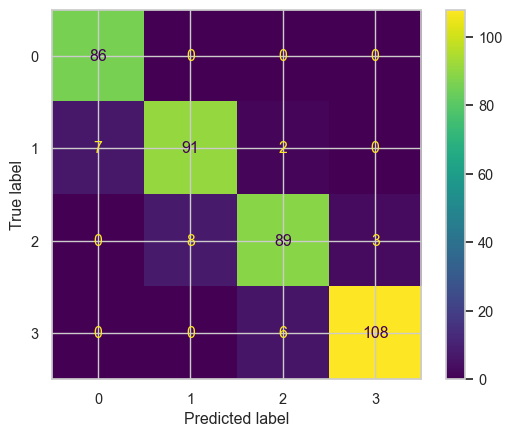

In [38]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

**2.&emsp;Вывод**  

Действительно модель стала работать лучше! Accuracy 0.94, а с дефолтными параметрами accuracy составил 0.92. Попробуем улучшить качество

**3.&emsp;Масштабирование значений признаков**

Попробуем еще кое-что изменить. А именно приведем значения признаков к одному масштабу: это можно делать алгоритмом `MinMaxScaler` или `StandardScaler`. Можем посмотреть и сравнить, какой метод сработает лучше в нашем случае

##### MinMaxScaler

In [39]:
normalizer = preprocessing.MinMaxScaler()

df_norm_minmax_np = normalizer.fit_transform(df)
df_norm_minmax = pd.DataFrame(data=df_norm_minmax_np, columns=df.columns)
df_norm_minmax.target = df_norm_minmax.target.apply(lambda x: int(x * 3))
df_norm_minmax.head(2)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,target
0,0.227789,0.0,0.68,0.0,0.052632,0.0,0.080645,0.555556,0.900000,0.142857,...,0.010204,0.170895,0.612774,0.285714,0.388889,0.944444,0.0,0.0,1.0,1
1,0.347361,1.0,0.00,1.0,0.000000,1.0,0.822581,0.666667,0.466667,0.285714,...,0.461735,0.993324,0.634687,0.857143,0.166667,0.277778,1.0,1.0,0.0,2


In [40]:
superBestPredictor(df_norm_minmax)
print(classification_report(pred, y_test))

Fitting 5 folds for each of 204 candidates, totalling 1020 fits
GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23,
                                         25, 27, 29, 31, 33, 35, 37, 39, 41, 43,
                                         45, 47, 49, 51, 53, 55, 57, 59, 61, ...],
                         'weights': ['uniform', 'distance']},
             verbose=1)
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        93
           1       0.91      0.92      0.91        99
           2       0.89      0.92      0.90        97
           3       0.95      0.97      0.96       111

    accuracy                           0.94       400
   macro avg       0.94      0.93      0.93       400
weighted avg       0.94      0.94      0.94       400



In [41]:
cv_res.sort_values('rank_test_score').head().style

,params,mean_fit_time,mean_test_score,rank_test_score
17,"{'metric': 'euclidean', 'n_neighbors': 19, 'weights': 'distance'}",0.005461,0.928125,1
153,"{'metric': 'minkowski', 'n_neighbors': 19, 'weights': 'distance'}",0.004331,0.928125,1
81,"{'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}",0.000401,0.927500,3
83,"{'metric': 'manhattan', 'n_neighbors': 17, 'weights': 'distance'}",0.003669,0.926875,4
163,"{'metric': 'minkowski', 'n_neighbors': 29, 'weights': 'distance'}",0.002581,0.926875,4


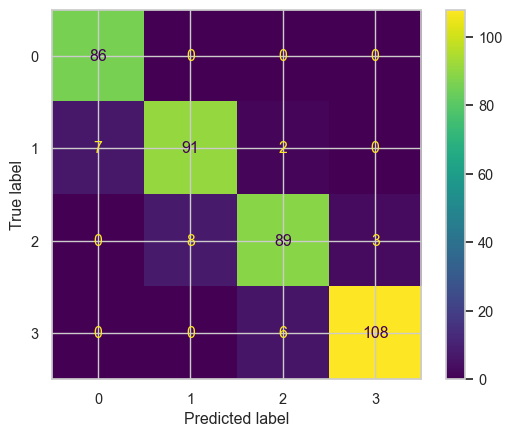

In [42]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

##### StandardScale

In [43]:
normalizer = preprocessing.StandardScaler()

df_norm_standard_np = normalizer.fit_transform(df.drop(['target'], axis=1))
df_norm_standard = pd.DataFrame(data=df_norm_standard_np, columns=df.columns[:-1])
df_norm_standard['target'] = df['target'] 
df_norm_standard.head(2)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,target
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,...,-1.408949,-1.146784,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097,1
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,...,0.585778,1.704465,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099,2


In [44]:
superBestPredictor(df_norm_standard)
print(classification_report(pred, y_test))

Fitting 5 folds for each of 204 candidates, totalling 1020 fits
GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23,
                                         25, 27, 29, 31, 33, 35, 37, 39, 41, 43,
                                         45, 47, 49, 51, 53, 55, 57, 59, 61, ...],
                         'weights': ['uniform', 'distance']},
             verbose=1)
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        93
           1       0.91      0.92      0.91        99
           2       0.89      0.92      0.90        97
           3       0.95      0.97      0.96       111

    accuracy                           0.94       400
   macro avg       0.94      0.93      0.93       400
weighted avg       0.94      0.94      0.94       400



In [45]:
cv_res.sort_values('rank_test_score').head().style

,params,mean_fit_time,mean_test_score,rank_test_score
17,"{'metric': 'euclidean', 'n_neighbors': 19, 'weights': 'distance'}",0.005461,0.928125,1
153,"{'metric': 'minkowski', 'n_neighbors': 19, 'weights': 'distance'}",0.004331,0.928125,1
81,"{'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}",0.000401,0.927500,3
83,"{'metric': 'manhattan', 'n_neighbors': 17, 'weights': 'distance'}",0.003669,0.926875,4
163,"{'metric': 'minkowski', 'n_neighbors': 29, 'weights': 'distance'}",0.002581,0.926875,4


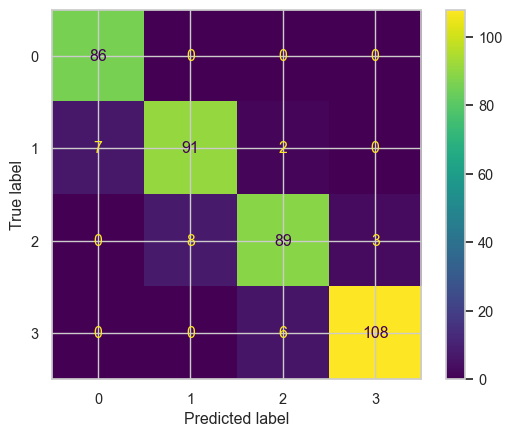

In [46]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

**4.&emsp;Вывод**  

Масштабирование признаков нам не помогло. Возможно, это связано с тем, что порядки значений признаков отличаются не настолько сильно, чтобы их приведение к единому масштабу повлияло на качество модели. Или же все дело в том, что метод `GridSearch` делает всю работу масштабирования за нас: подбирая веса таким образом, чтобы масштаб значений был примерно одинаковым и не влиял на качество модели.  

Перейдем к обучению модели методом логистической регрессии.

## шаг 4: классификация методом логистической регрессии

**1.&emsp;Аэаэа ну да, просто обучаем**  

Окей, сначала снова сделаем тестовую и тренировочную выборки:

In [47]:
X_train, X_test, y_train, y_test = train_test_split(
    df, df['target'], test_size=0.20, random_state=1, stratify=df['target']  # stratify отвечает за пропорции классов
    )

print(X_train.shape, X_test.shape)

(1600, 21) (400, 21)


In [48]:
logreg = LogisticRegression(random_state=102)
logreg.fit(X_train, y_train)

LogisticRegression(random_state=102)

In [49]:
pred = logreg.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       0.75      0.78      0.77        96
           1       0.50      0.49      0.50       102
           2       0.40      0.44      0.42        90
           3       0.74      0.66      0.70       112

    accuracy                           0.60       400
   macro avg       0.60      0.59      0.59       400
weighted avg       0.60      0.60      0.60       400



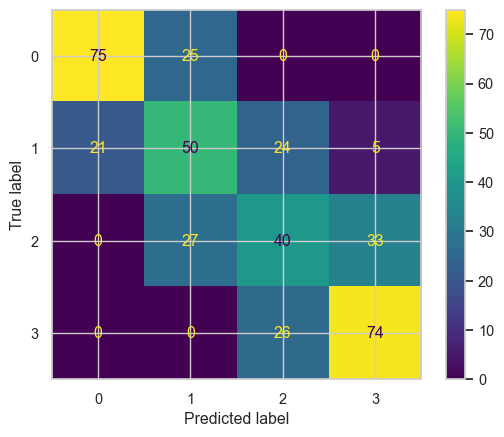

In [50]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

**2.&emsp;Подберем гиперпараметры через `GridSearch`**  

По поводу первой попытки обучить модель логистической регрессии $-$ оставим без комментариев (accuracy 0.6 вам о чем-нибудь говорит? я желаю всем мужчинам обучить модель логистической регрессии, слава евгению соколову)

In [51]:
%%time

parameters = {
    'C': np.logspace(-4, 4, 10),         
    'penalty': ['l1', 'l2', 'elasticnet'], 
    'solver': ['liblinear', 'lbfgs', 'saga'],  
    'class_weight': [None, 'balanced'],  
    'tol': [1e-4, 1e-3, 1e-2],  
    'fit_intercept': [True, False]
}

logreg = LogisticRegression(random_state=102)
clf = GridSearchCV(logreg, parameters, cv=5, verbose=1)
clf.fit(X_train, y_train);

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
CPU times: total: 3min 13s
Wall time: 3min 14s


In [52]:
cv_res = pd.DataFrame(clf.cv_results_)[['params', 'mean_fit_time', 'mean_test_score', 'rank_test_score']]
cv_res.sort_values('rank_test_score').head().style

,params,mean_fit_time,mean_test_score,rank_test_score
433,"{'C': np.float64(0.3593813663804626), 'class_weight': None, 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}",0.066939,0.938125,1
487,"{'C': np.float64(0.3593813663804626), 'class_weight': 'balanced', 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}",0.057585,0.938125,1
486,"{'C': np.float64(0.3593813663804626), 'class_weight': 'balanced', 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.0001}",0.091517,0.938125,3
432,"{'C': np.float64(0.3593813663804626), 'class_weight': None, 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.0001}",0.124632,0.938125,3
765,"{'C': np.float64(166.81005372000558), 'class_weight': None, 'fit_intercept': True, 'penalty': 'l2', 'solver': 'liblinear', 'tol': 0.0001}",0.074181,0.935000,5


In [53]:
logreg = clf.best_estimator_
pred = logreg.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       100
           1       0.84      0.81      0.82       104
           2       0.80      0.83      0.82        96
           3       1.00      1.00      1.00       100

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.91       400



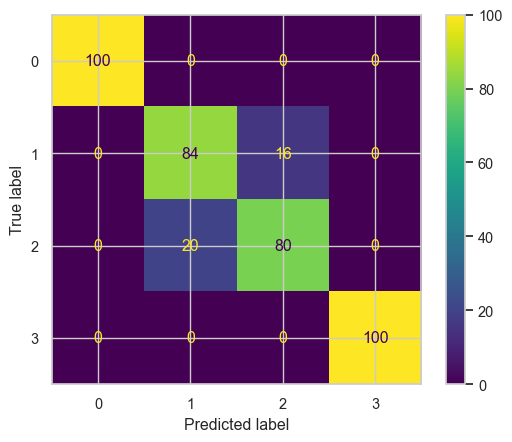

In [54]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

**3.&emsp;Оценим качество**  

Гораздо лучше: показатель accuracy повысился с 0.6 до 0.91 $-$ это очень здорово! При этом путаются только 1 и 2 классы. Давайте посмотрим, какие параметры были установлены для модели:

In [55]:
cv_res.sort_values('rank_test_score')['params'][0]

{'C': np.float64(0.0001),
 'class_weight': None,
 'fit_intercept': True,
 'penalty': 'l1',
 'solver': 'liblinear',
 'tol': 0.0001}

Сильная регуляризация (с=0.0001), нет весов на классы (ну это и объяснимо: они у нас сбалансированы), `'fit_intercept': True` потому что данные не централизованы относительно нуля, `l1` $-$ лассо-регуляризация $-$ приводит некоторые признаки к нулю, `liblinear` потому что маленький датасет и сочетается с `l1`, а `tol` отвечает чисто за времязатратность, не влияя на саму модель. Посмотрим, какие параметры были установлены в моделях, которые проявили себя лучше всего (на примере топ-20):

In [56]:
top_20 = pd.Series(cv_res.sort_values('rank_test_score')['params'][:20])
print(f'class_weight = {top_20.apply(lambda x: x['class_weight']).value_counts()},\n\n'
      f'C = {top_20.apply(lambda x: x['C']).value_counts()},\n\n'
      f'fit_intercept = {top_20.apply(lambda x: x['fit_intercept']).value_counts()},\n\n'
      f'penalty = {top_20.apply(lambda x: x['penalty']).value_counts()},\n\n'
      f'solver = {top_20.apply(lambda x: x['solver']).value_counts()},\n\n'
      f'tol = {top_20.apply(lambda x: x['tol']).value_counts()}')

class_weight = params
balanced    9
Name: count, dtype: int64,

C = params
166.810054      5
0.359381        4
2.782559        4
21.544347       4
1291.549665     2
10000.000000    1
Name: count, dtype: int64,

fit_intercept = params
True    20
Name: count, dtype: int64,

penalty = params
l1    16
l2     4
Name: count, dtype: int64,

solver = params
liblinear    20
Name: count, dtype: int64,

tol = params
0.0001    15
0.0010     5
Name: count, dtype: int64


Окей! Значит, можем в `parameters` при подборе гиперпараметров загрузить чуть меньше параметров на перебор. Потом замерим время и сравним ради интереса.  
Думаю, пора стать лучшей версией себя и улучшить модель.

## шаг 5: улучшенный метод логистической регрессии

**1.&emsp;Удалим некоторые признаки**  

Мы уже говорили, что некоторые признаки коррелируют друг с другом и что это может негативно влиять на реализацию модель. Попробуем убрать сначала 3 признака (в скобках с каким другим коррелирует): `sc_w` (`sc_h`), `fc` (`pc`), `four_g` (`three_g`).

In [57]:
dropped_df = df.drop(['sc_w', 'fc', 'four_g'], axis=1)
dropped_df.head(2)

,battery_power,blue,clock_speed,dual_sim,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,talk_time,three_g,touch_screen,wifi,target
0,842,0,2.2,0,7,0.6,188,2,2,20,756,2549,9,19,0,0,1,1
1,1021,1,0.5,1,53,0.7,136,3,6,905,1988,2631,17,7,1,1,0,2


**2.&emsp;Нормализуем значения признаков**

In [58]:
# используем MinMaxScaler
normalizer = preprocessing.MinMaxScaler()

dropped_df_norm_minmax_np = normalizer.fit_transform(dropped_df)
dropped_df_norm_minmax = pd.DataFrame(data=dropped_df_norm_minmax_np, columns=dropped_df.columns)
dropped_df_norm_minmax.target = dropped_df_norm_minmax.target.apply(lambda x: int(x * 3))  # чтобы сохранить таргетный признак
dropped_df_norm_minmax.head()

,battery_power,blue,clock_speed,dual_sim,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,talk_time,three_g,touch_screen,wifi,target
0,0.227789,0.0,0.68,0.0,0.080645,0.555556,0.900000,0.142857,0.10,0.010204,0.170895,0.612774,0.285714,0.944444,0.0,0.0,1.0,1
1,0.347361,1.0,0.00,1.0,0.822581,0.666667,0.466667,0.285714,0.30,0.461735,0.993324,0.634687,0.857143,0.277778,1.0,1.0,0.0,2
2,0.041416,1.0,0.00,1.0,0.629032,0.888889,0.541667,0.571429,0.30,0.644388,0.811749,0.627205,0.428571,0.388889,1.0,1.0,0.0,2
3,0.076152,1.0,0.80,0.0,0.129032,0.777778,0.425000,0.714286,0.45,0.620408,0.858478,0.671566,0.785714,0.500000,1.0,0.0,0.0,2
4,0.881764,1.0,0.28,0.0,0.677419,0.555556,0.508333,0.142857,0.70,0.616327,0.475300,0.308658,0.214286,0.722222,1.0,1.0,0.0,1


In [59]:
X = dropped_df_norm_minmax.drop(['target'], axis=1)
y = dropped_df_norm_minmax['target']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=91, 
    stratify=dropped_df_norm_minmax['target']  # stratify отвечает за пропорции классов
    )

print(X_train.shape, X_test.shape)

(1600, 17) (400, 17)


**3.&emsp;Проведем подбор гиперпараметров заново**

In [60]:
%%time

parameters = {
    'C': np.logspace(-4, 4, 10),         
    'penalty': ['l1', 'l2'], 
    'solver': ['liblinear'],  
    'class_weight': [None, 'balanced'],  
    'tol': [1e-4, 1e-3],  
    'fit_intercept': [True]
}

logreg = LogisticRegression(random_state=91)
clf = GridSearchCV(logreg, parameters, cv=5, verbose=1)
clf.fit(X_train, y_train);

Fitting 5 folds for each of 80 candidates, totalling 400 fits
CPU times: total: 1min
Wall time: 1min


In [61]:
cv_res = pd.DataFrame(clf.cv_results_)[['params', 'mean_fit_time', 'mean_test_score', 'rank_test_score']]
cv_res.sort_values('rank_test_score').head(2).style

,params,mean_fit_time,mean_test_score,rank_test_score
72,"{'C': np.float64(10000.0), 'class_weight': None, 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.0001}",1.298143,0.866875,1
76,"{'C': np.float64(10000.0), 'class_weight': 'balanced', 'fit_intercept': True, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.0001}",1.346416,0.866875,1


In [62]:
logreg = clf.best_estimator_
pred = logreg.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       101
           1       0.79      0.85      0.82        93
           2       0.84      0.80      0.82       105
           3       0.99      0.98      0.99       101

    accuracy                           0.91       400
   macro avg       0.91      0.90      0.90       400
weighted avg       0.91      0.91      0.91       400



`Accuracy` не изменился: `precision` и `recall` остались у всех примерно теми же. Что-то явно не так, мы же достаточно сильно изменили данные!

**4.&emsp;Давайте теперь попробуем подобрать гиперпараметры еще раз**  

Возможно, не изменившийся уровень `accuracy` связан с тем, что мы сильно ограничили перебор параметров, предположив, что лучшие параметры до изменений датасетов остались прежними. Проведем же теперь новый `GridSearch`, который будет таким же, как и в первый раз.

In [63]:
%%time

parameters = {
    'C': np.logspace(-4, 4, 10),         
    'penalty': ['l1', 'l2', 'elasticnet'], 
    'solver': ['liblinear', 'lbfgs', 'saga'],  
    'class_weight': [None, 'balanced'],  
    'tol': [1e-4, 1e-3, 1e-2],  
    'fit_intercept': [True, False]
}

logreg = LogisticRegression(random_state=102)
clf = GridSearchCV(logreg, parameters, cv=5, verbose=1)
clf.fit(X_train, y_train);

Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
CPU times: total: 2min 1s
Wall time: 2min 2s


In [64]:
cv_res = pd.DataFrame(clf.cv_results_)[['params', 'mean_fit_time', 'mean_test_score', 'rank_test_score']]
cv_res.sort_values('rank_test_score').head(2).style

,params,mean_fit_time,mean_test_score,rank_test_score
984,"{'C': np.float64(10000.0), 'class_weight': None, 'fit_intercept': True, 'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001}",0.022741,0.966875,1
1038,"{'C': np.float64(10000.0), 'class_weight': 'balanced', 'fit_intercept': True, 'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001}",0.031064,0.966875,1


In [65]:
logreg = clf.best_estimator_
pred = logreg.predict(X_test)
print(classification_report(pred, y_test))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       101
           1       0.98      1.00      0.99        98
           2       0.99      0.98      0.99       101
           3       0.99      0.99      0.99       100

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



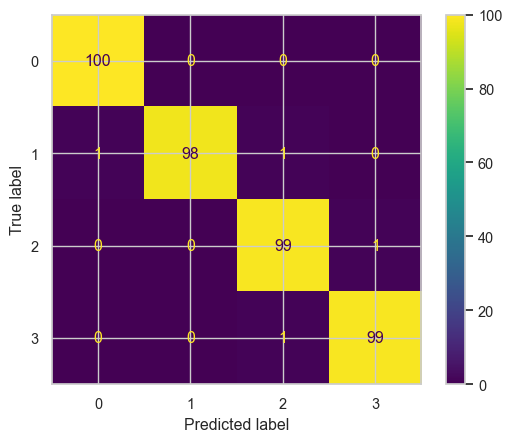

In [66]:
matrix = confusion_matrix(y_test, pred, labels=target_labels, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
disp.plot();

**5.&emsp;Результаты модели, обученной методом логистической регресии**  

Отлично! Мне все нравится: `accuracy` поднялся до 0.99 (аналогично в среднем `precision` и `recall`) с 0.60 в модели без подобранных гиперпараметров. То есть, действительно, опираться на гиперпараметры модели, работавшей с одним набором данных, при подборе гиперпараметров для модели для нового набора данных неправильно, по крайней мере в нашем случае. 

## шаг 6: результаты

Мы обучили две модели: методом kNN и логистической регрессии. Обе модели обучались на обучающей выборке, которая составляла 80%, и проверялись на тестовой (20% датасета). В итоге, после подбора гиперпараметров методом `GridSearch` обе модели показали высокие результаты: `accuracy` составил 0.94 и 0.99, соответственно. Такой высокий результат во второом случае, скорее всего, объясним тем, что мы удалили по одному признаку из 3-х пар коррелирующих между собой нецелевых признака, каждый из которых при этом не значительно коррелировал с таргетным (корреляция нетаргетных признаков между собой серьезно мешает модели логистической регрессии).  

Вообще, я немного опасаюсь, что получились такие результаты $-$ мне слабо верится, что модель не переобучилась. С другой стороны, там и корреляция признака `ram` с таргетом составляла 0.94. То есть с дополнением в виде остальных признаков, возможно, модель действительно смогла обучиться настолько хорошо.  

